In [1]:
import os
import numpy as np 
import itertools
import matplotlib
from glob import glob
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib.markers import MarkerStyle
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
from matplotlib import rc
rc('text', usetex=True)
rc('font', family='serif')
rc('font', serif='times')
rc('mathtext', default='sf')
rc("lines", markeredgewidth=1)
rc("lines", linewidth=1)
rc('axes', titlesize=24) #24
rc('axes', labelsize=24) #24
rc("axes", linewidth=1) #2)
rc('axes', labelpad=20) #24)
rc('xtick', labelsize=16)
rc('ytick', labelsize=16)
rc('legend', fontsize=16)
rc('ytick', right='True',direction= 'in')
rc('xtick', top='True',direction= 'in')
rc('xtick.major', pad=15) #8)
rc('ytick.major', pad=15) #8)
rc('xtick.major', size=12) #8)
rc('ytick.major', size=12) #8)
rc('xtick.minor', size=7) #8)
rc('ytick.minor', size=7) #8)
rc('figure', titlesize=27) #24)

def set_tick_sizes(ax, major, minor):
    for l in ax.get_xticklines() + ax.get_yticklines():
        l.set_markersize(major)
    for tick in ax.xaxis.get_minor_ticks() + ax.yaxis.get_minor_ticks():
        tick.tick1line.set_markersize(minor)
        tick.tick2line.set_markersize(minor)
    ax.xaxis.LABELPAD=10.
    ax.xaxis.OFFSETTEXTPAD=10.

## Injections

In [ ]:
indices_singles_a = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population_injections/SINGLES_A_*.npy')]
indices_singles_b = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population_injections/SINGLES_B_*.npy')]
indices_match = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_2D_H1_*.npy')]
indices_ml = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_ML_4D_H1_*.npy')]
indices_ml2 = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_SL_2D_H1_*.npy')]
indices_ml2c = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_SLC_3D_H1_*.npy')]
indices_ecc = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_ECC_3D_H1_*.npy')]
indices_ecc_0 = [int(f.split('_')[-1].split('.')[0]) for f in glob('../../output/pe_population_3G/population/FF_ECC_0_2D_H1_*.npy')]

indices = list(set(indices_singles_a).intersection(indices_singles_b).intersection(indices_match).intersection(indices_ml).intersection(indices_ml2).intersection(indices_ml2c).intersection(indices_ecc).intersection(indices_ecc_0))

In [ ]:
data_a, data_b = [], []
mchirp_a, mchirp_b = np.zeros(len(indices)), np.zeros(len(indices))
eta_a, eta_b = np.zeros(len(indices)), np.zeros(len(indices))
eff_spin_a, eff_spin_b = np.zeros(len(indices)), np.zeros(len(indices))
delta_tc, snr_a, snr_b, snr_ratio = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))

for i in range(len(indices)):
    data_a.append(np.load('../../output/pe_population_3G/population_injections/SINGLES_A_{}.npy'.format(indices[i]), allow_pickle=True).item())
    data_b.append(np.load('../../output/pe_population_3G/population_injections/SINGLES_B_{}.npy'.format(indices[i]), allow_pickle=True).item())

    mchirp_a[i], mchirp_b[i] = np.power(data_a[i]['mass_1']*data_a[i]['mass_2'], (3/5))/np.power(data_a[i]['mass_1']+data_a[i]['mass_2'], (1/5)), np.power(data_b[i]['mass_1']*data_b[i]['mass_2'], (3/5))/np.power(data_b[i]['mass_1']+data_b[i]['mass_2'], (1/5))
    eta_a[i], eta_b[i] = (data_a[i]['mass_1']*data_a[i]['mass_2'])/np.power(data_a[i]['mass_1']+data_a[i]['mass_2'], 2), (data_b[i]['mass_1']*data_b[i]['mass_2'])/np.power(data_b[i]['mass_1']+data_b[i]['mass_2'], 2)
    eff_spin_a[i], eff_spin_b[i] = data_a[i]['a_1'], data_b[i]['a_1']

    delta_tc[i] = data_b[i]['geocent_time'] - data_a[i]['geocent_time']
    snr_a[i], snr_b[i] = data_a[i]['snr_det'], data_b[i]['snr_det']
    snr_ratio[i] = snr_b[i]/snr_a[i]

snr_a = 24 * np.ones(len(snr_a))
snr_b = snr_ratio * snr_a

In [5]:
mask_0 = np.where((snr_a/snr_b > 0.1) & (snr_a/snr_b < 10) & (mchirp_a/mchirp_b > 0.1) & (mchirp_a/mchirp_b < 10))[0]
mchirp_a, mchirp_b = mchirp_a[mask_0], mchirp_b[mask_0]
snr_a, snr_b = snr_a[mask_0], snr_b[mask_0]
delta_tc = delta_tc[mask_0]

## Microlensing Recovery

In [ ]:
match_ml, mchirp_ml, eta_ml, Ml_z_ml, y_ml = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_ML_4D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml_H1, mchirp_ml_H1, eta_ml_H1, Ml_z_ml_H1, y_ml_H1 = data_H1[0], data_H1[1], data_H1[2], data_H1[3], data_H1[4]
        data_L1 = np.load('../../output/pe_population_3G/population/FF_ML_4D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml_L1, mchirp_ml_L1, eta_ml_L1, Ml_z_ml_L1, y_ml_L1 = data_L1[0], data_L1[1], data_L1[2], data_L1[3], data_L1[4]
        data_V1 = np.load('../../output/pe_population_3G/population/FF_ML_4D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml_V1, mchirp_ml_V1, eta_ml_V1, Ml_z_ml_V1, y_ml_V1 = data_V1[0], data_V1[1], data_V1[2], data_V1[3], data_V1[4]

        match_ml[i] = np.sqrt(np.median([match_ml_H1**2, match_ml_L1**2, match_ml_V1**2]))
        mchirp_ml[i] = np.median([mchirp_ml_H1, mchirp_ml_L1, mchirp_ml_V1])
        eta_ml[i] = np.median([eta_ml_H1, eta_ml_L1, eta_ml_V1])
        Ml_z_ml[i] = np.median([Ml_z_ml_H1, Ml_z_ml_L1, Ml_z_ml_V1])
        y_ml[i] = np.median([y_ml_H1, y_ml_L1, y_ml_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_ML_4D_H1_{}.npy'.format(indices[i]), allow_pickle=True)    
        match_ml[i], mchirp_ml[i], eta_ml[i], Ml_z_ml[i], y_ml[i] = data[0], data[1], data[2], data[3], data[4]

In [7]:
match_ml, mchirp_ml, eta_ml, Ml_z_ml, y_ml = match_ml[mask_0], mchirp_ml[mask_0], eta_ml[mask_0], Ml_z_ml[mask_0], y_ml[mask_0]

In [8]:
bias_mchirp_a_ml = np.abs(mchirp_ml-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml = np.abs(mchirp_ml-mchirp_b)/mchirp_b*100

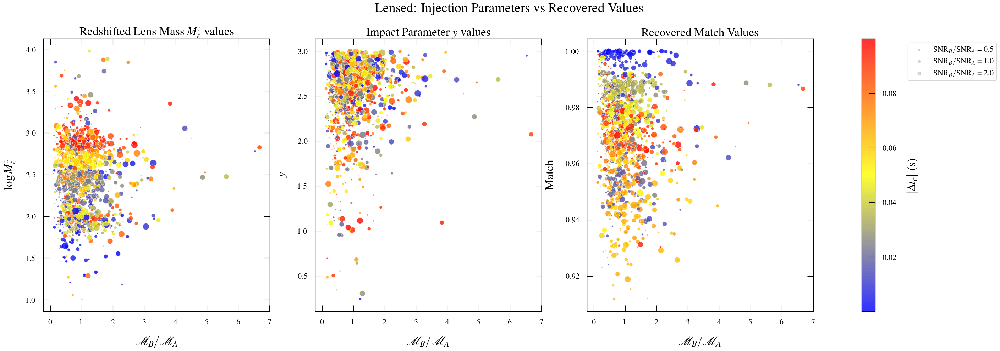

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(35, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, np.log10(Ml_z_ml), c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$\\log M_{\\ell}^z$')
axes[0].set_title('Redshifted Lens Mass $M_{\ell}^z$ values')
axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, y_ml, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('$y$')
axes[1].set_title('Impact Parameter $y$ values')

axes[1].set_axisbelow(True)

scatter3 = axes[2].scatter(mchirp_b/mchirp_a, match_ml, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('Match')
axes[2].set_title('Recovered Match Values')

axes[2].set_axisbelow(True)
cbar = plt.colorbar(scatter3, ax=[axes[0], axes[1], axes[2]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

fig.suptitle('Lensed: Injection Parameters vs Recovered Values')
plt.savefig('../../output/pe_population_3G/match_population/LENS_ML.png')
plt.show()

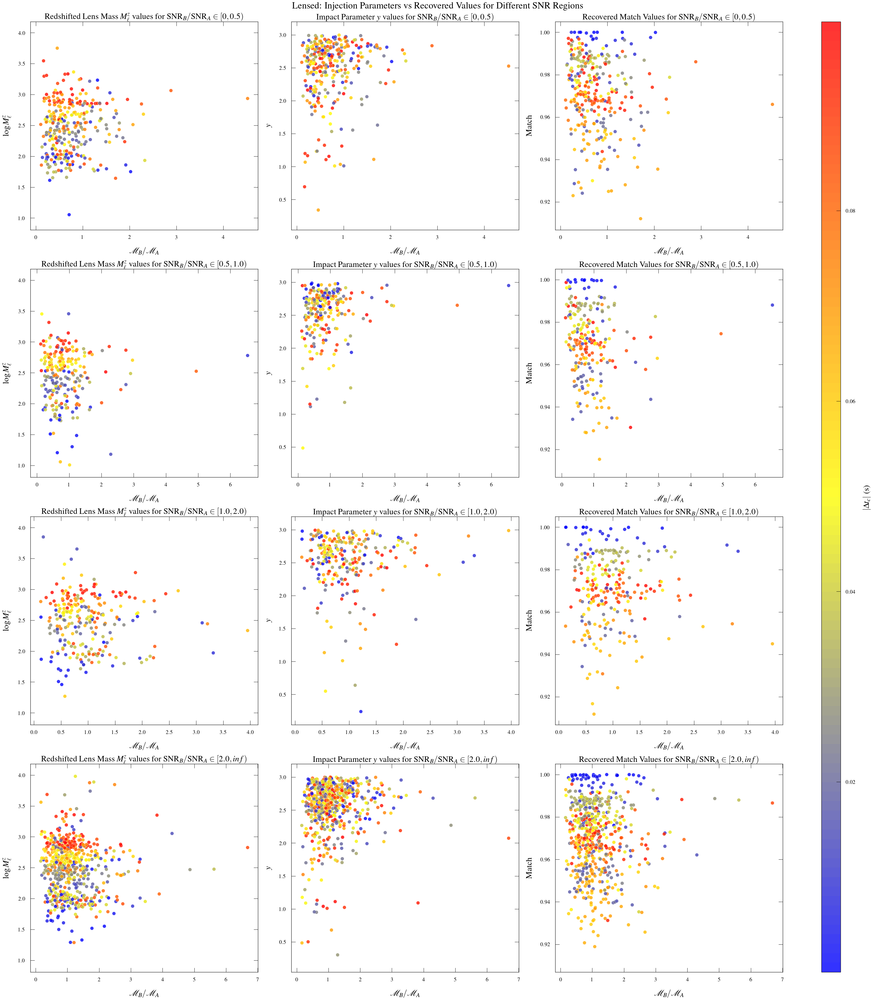

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(35, 40), constrained_layout=True)
snr_regions = [(0, 0.5), (0.5, 1.0), (1.0, 2.0), (2.0, np.inf)]

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)

for i, (snr_min, snr_max) in enumerate(snr_regions):
    mask = (snr_b / snr_a > snr_min) & (snr_b / snr_a <= snr_max)

    scatter1 = axes[i, 0].scatter(
        mchirp_b[mask] / mchirp_a[mask], np.log10(Ml_z_ml)[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 0].set_ylabel('$\log M_{\ell}^z$')
    axes[i, 0].set_title('Redshifted Lens Mass $M_{{\ell}}^z$ values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 0].set_ylim(np.min(np.log10(Ml_z_ml))-0.2, np.max(np.log10(Ml_z_ml))+0.2)

    scatter2 = axes[i, 1].scatter(
        mchirp_b[mask] / mchirp_a[mask], y_ml[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 1].set_ylabel('$y$')
    axes[i, 1].set_title('Impact Parameter $y$ values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 1].set_ylim(np.min(y_ml)-0.2, np.max(y_ml)+0.2)

    scatter3 = axes[i, 2].scatter(
        mchirp_b[mask] / mchirp_a[mask], match_ml[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 2].set_ylabel('Match')
    axes[i, 2].set_title('Recovered Match Values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 2].set_ylim(np.min(match_ml)-0.005, np.max(match_ml)+0.005)

cbar = fig.colorbar(scatter3, ax=axes, location='right', aspect=50)
cbar.set_label('$|\Delta t_c|$ (s)')

fig.suptitle('Lensed: Injection Parameters vs Recovered Values for Different SNR Regions')
plt.savefig('../../output/pe_population_3G/match_population/LENS_ML_SNR.png')
plt.show()

## Type II Lensed Recovery

In [ ]:
match_ml2, mchirp_ml2, eta_ml2 = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_SL_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2_H1, mchirp_ml2_H1, eta_ml2_H1 = data_H1[0], data_H1[1], data_H1[2]
        data_L1 = np.load('../../output/pe_population_3G/population/FF_SL_2D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2_L1, mchirp_ml2_L1, eta_ml2_L1 = data_L1[0], data_L1[1], data_L1[2]
        data_V1 = np.load('../../output/pe_population_3G/population/FF_SL_2D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2_V1, mchirp_ml2_V1, eta_ml2_V1 = data_V1[0], data_V1[1], data_V1[2]

        match_ml2[i] = np.sqrt(np.median([match_ml2_H1**2, match_ml2_L1**2, match_ml2_V1**2]))
        mchirp_ml2[i] = np.median([mchirp_ml2_H1, mchirp_ml2_L1, mchirp_ml2_V1])
        eta_ml2[i] = np.median([eta_ml2_H1, eta_ml2_L1, eta_ml2_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_SL_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2[i], mchirp_ml2[i], eta_ml2[i], = data[0], data[1], data[2]

In [12]:
match_ml2, mchirp_ml2, eta_ml2 = match_ml2[mask_0], mchirp_ml2[mask_0], eta_ml2[mask_0]

In [13]:
bias_mchirp_a_ml2 = np.abs(mchirp_ml2-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml2 = np.abs(mchirp_ml2-mchirp_b)/mchirp_b*100

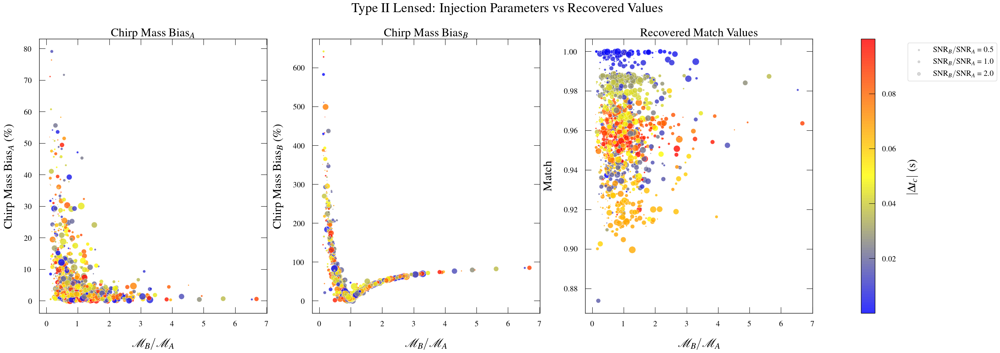

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(35, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, bias_mchirp_a_ml2, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('Chirp Mass Bias$_A$ (\%)')
axes[0].set_title('Chirp Mass Bias$_A$')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, bias_mchirp_b_ml2, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('Chirp Mass Bias$_B$ (\%)')
axes[1].set_title('Chirp Mass Bias$_B$')

axes[1].set_axisbelow(True)

scatter3 = axes[2].scatter(mchirp_b/mchirp_a, match_ml2, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('Match')
axes[2].set_title('Recovered Match Values')

axes[2].set_axisbelow(True)
cbar = plt.colorbar(scatter3, ax=[axes[0], axes[1], axes[2]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

fig.suptitle('Type II Lensed: Injection Parameters vs Recovered Values')
plt.savefig('../../output/pe_population_3G/match_population/ML2.png')
plt.show()

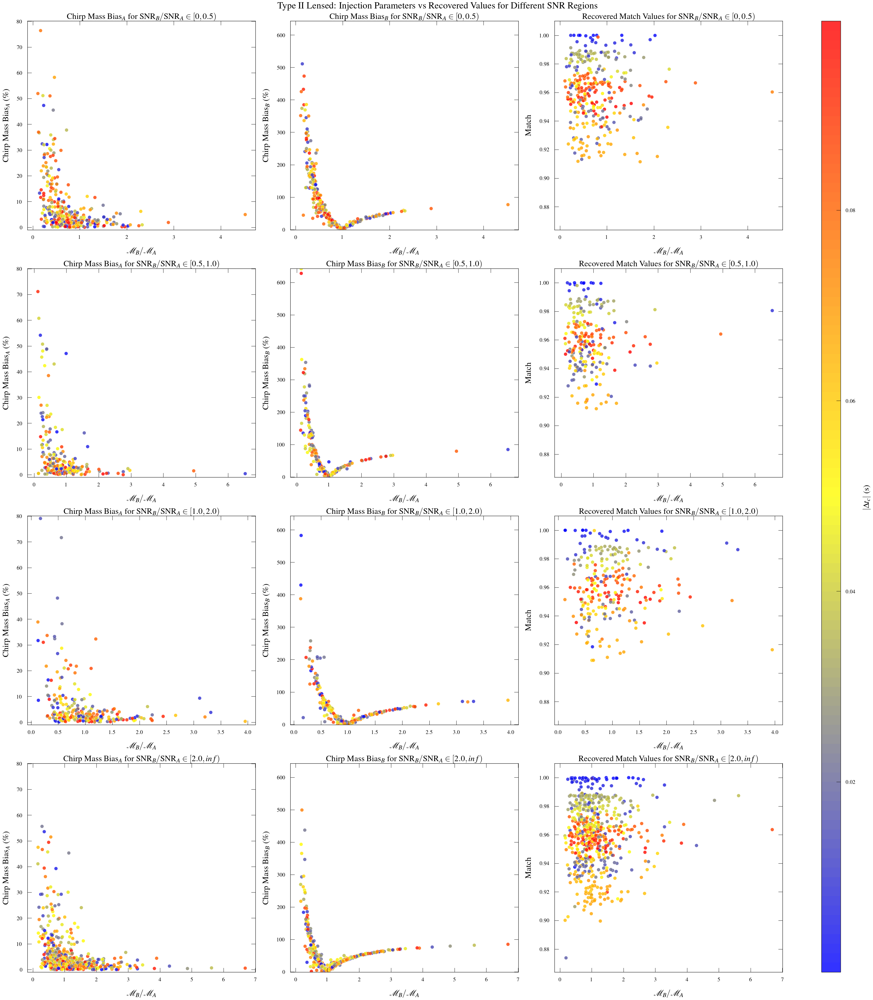

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(35, 40), constrained_layout=True)
snr_regions = [(0, 0.5), (0.5, 1.0), (1.0, 2.0), (2.0, np.inf)]

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)

for i, (snr_min, snr_max) in enumerate(snr_regions):
    mask = (snr_b / snr_a > snr_min) & (snr_b / snr_a <= snr_max)

    scatter1 = axes[i, 0].scatter(
        mchirp_b[mask] / mchirp_a[mask], bias_mchirp_a_ml2[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 0].set_ylabel('Chirp Mass Bias$_A$ (\%)')
    axes[i, 0].set_title('Chirp Mass Bias$_A$ for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 0].set_ylim(np.min(bias_mchirp_a_ml2)-1, np.max(bias_mchirp_a_ml2)+1)

    scatter2 = axes[i, 1].scatter(
        mchirp_b[mask] / mchirp_a[mask], bias_mchirp_b_ml2[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 1].set_ylabel('Chirp Mass Bias$_B$ (\%)')
    axes[i, 1].set_title('Chirp Mass Bias$_B$ for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 1].set_ylim(np.min(bias_mchirp_b_ml2)-1, np.max(bias_mchirp_b_ml2)+1)

    scatter3 = axes[i, 2].scatter(
        mchirp_b[mask] / mchirp_a[mask], match_ml2[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 2].set_ylabel('Match')
    axes[i, 2].set_title('Recovered Match Values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 2].set_ylim(np.min(match_ml2)-0.01, np.max(match_ml2)+0.01)

cbar = fig.colorbar(scatter3, ax=axes, location='right', aspect=50)
cbar.set_label('$|\Delta t_c|$ (s)')

fig.suptitle('Type II Lensed: Injection Parameters vs Recovered Values for Different SNR Regions')
plt.savefig('../../output/pe_population_3G/match_population/ML2_SNR.png')
plt.show()

## Type II Lensed (C) Recovery

In [ ]:
match_ml2c, mchirp_ml2c, eta_ml2c, n_ml2c = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_SLC_3D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2c_H1, mchirp_ml2c_H1, eta_ml2c_H1, n_ml2c_H1 = data_H1[0], data_H1[1], data_H1[2], (data_H1[3]-1)/2
        data_L1 = np.load('../../output/pe_population_3G/population/FF_SLC_3D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2c_L1, mchirp_ml2c_L1, eta_ml2c_L1, n_ml2c_L1 = data_L1[0], data_L1[1], data_L1[2], (data_L1[3]-1)/2
        data_V1 = np.load('../../output/pe_population_3G/population/FF_SLC_3D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2c_V1, mchirp_ml2c_V1, eta_ml2c_V1, n_ml2c_V1 = data_V1[0], data_V1[1], data_V1[2], (data_V1[3]-1)/2

        match_ml2c[i] = np.sqrt(np.median([match_ml2c_H1**2, match_ml2c_L1**2, match_ml2c_V1**2]))
        mchirp_ml2c[i] = np.median([mchirp_ml2c_H1, mchirp_ml2c_L1, mchirp_ml2c_V1])
        eta_ml2c[i] = np.median([eta_ml2c_H1, eta_ml2c_L1, eta_ml2c_V1])
        n_ml2c[i] = np.median([n_ml2c_H1, n_ml2c_L1, n_ml2c_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_SLC_3D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ml2c[i], mchirp_ml2c[i], eta_ml2c[i], n_ml2c[i] = data[0], data[1], data[2], (data[3]-1)/2

In [17]:
match_ml2c, mchirp_ml2c, eta_ml2c, n_ml2c = match_ml2c[mask_0], mchirp_ml2c[mask_0], eta_ml2c[mask_0], n_ml2c[mask_0]

In [18]:
bias_mchirp_a_ml2c = np.abs(mchirp_ml2c-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml2c = np.abs(mchirp_ml2c-mchirp_b)/mchirp_b*100

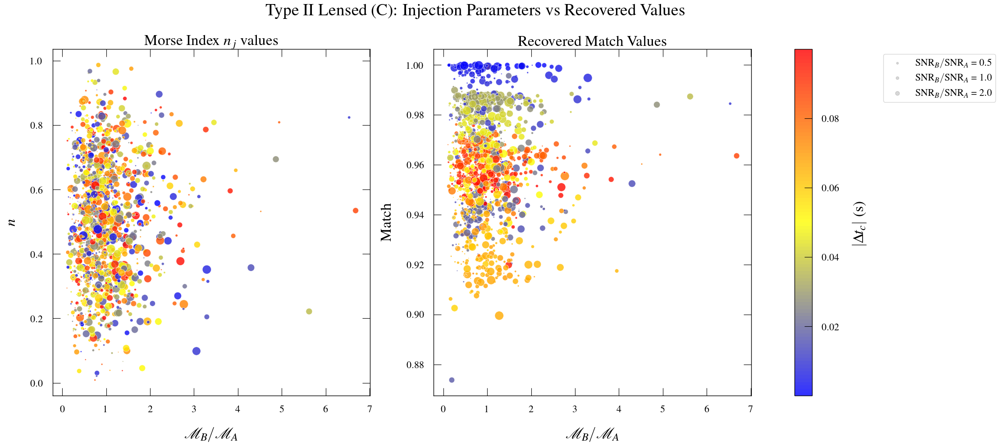

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, n_ml2c, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$n$')
axes[0].set_title('Morse Index $n_j$ values')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, match_ml2c, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('Match')
axes[1].set_title('Recovered Match Values')

axes[1].set_axisbelow(True)
cbar = plt.colorbar(scatter2, ax=[axes[0], axes[1]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[1].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

fig.suptitle('Type II Lensed (C): Injection Parameters vs Recovered Values')
plt.savefig('../../output/pe_population_3G/match_population/ML2C.png')
plt.show()

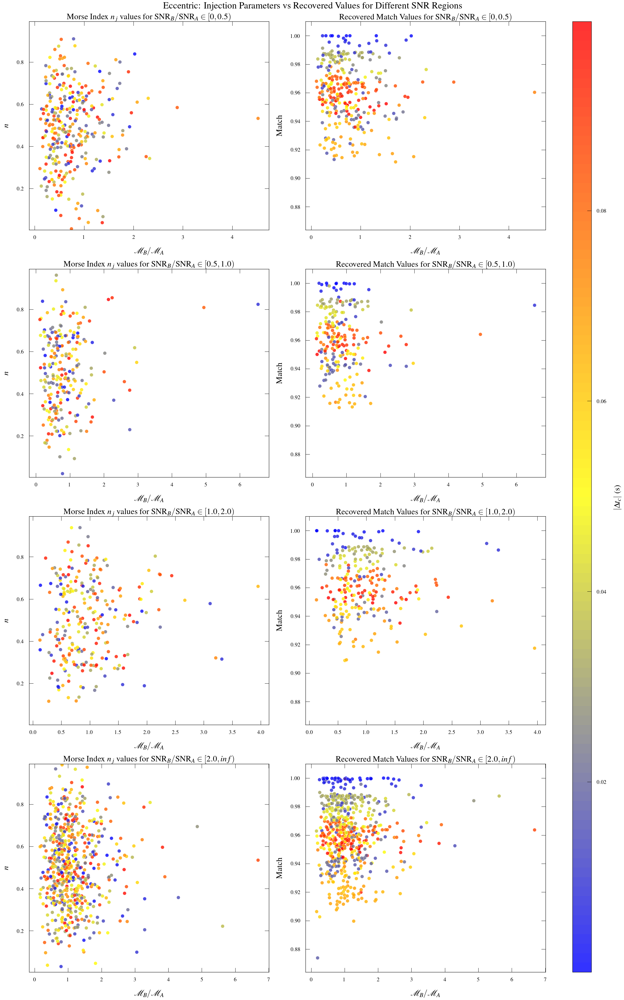

In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(25, 40), constrained_layout=True)

for i, (snr_min, snr_max) in enumerate(snr_regions):
    mask = (snr_b / snr_a > snr_min) & (snr_b / snr_a <= snr_max)

    scatter1 = axes[i, 0].scatter(
        mchirp_b[mask] / mchirp_a[mask], n_ml2c[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 0].set_ylabel('$n$')
    axes[i, 0].set_title('Morse Index $n_j$ values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 0].set_ylim(np.min(n_ml2c)-0.005, np.max(n_ml2c)+0.005)

    scatter2 = axes[i, 1].scatter(
        mchirp_b[mask] / mchirp_a[mask], match_ml2c[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 1].set_ylabel('Match')
    axes[i, 1].set_title('Recovered Match Values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 1].set_ylim(np.min(match_ml2c)-0.01, np.max(match_ml2c)+0.01)

cbar = fig.colorbar(scatter2, ax=axes, location='right', aspect=50)
cbar.set_label('$|\Delta t_c|$ (s)')
fig.suptitle('Eccentric: Injection Parameters vs Recovered Values for Different SNR Regions')
plt.savefig('../../output/pe_population_3G/match_population/ML2C_SNR.png')
plt.show()

## Eccentric Recovery

In [ ]:
match_ecc, mchirp_ecc, eta_ecc, e_ecc = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_ECC_3D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_H1, mchirp_ecc_H1, eta_ecc_H1, e_ecc_H1 = data_H1[0], data_H1[1], data_H1[2], data_H1[3]
        data_L1 = np.load('../../output/pe_population_3G/population/FF_ECC_3D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_L1, mchirp_ecc_L1, eta_ecc_L1, e_ecc_L1 = data_L1[0], data_L1[1], data_L1[2], data_L1[3]
        data_V1 = np.load('../../output/pe_population_3G/population/FF_ECC_3D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_V1, mchirp_ecc_V1, eta_ecc_V1, e_ecc_V1 = data_V1[0], data_V1[1], data_V1[2], data_V1[3]

        match_ecc[i] = np.sqrt(np.median([match_ecc_H1**2, match_ecc_L1**2, match_ecc_V1**2]))
        mchirp_ecc[i] = np.median([mchirp_ecc_H1, mchirp_ecc_L1, mchirp_ecc_V1])
        eta_ecc[i] = np.median([eta_ecc_H1, eta_ecc_L1, eta_ecc_V1])
        e_ecc[i] = np.median([e_ecc_H1, e_ecc_L1, e_ecc_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_ECC_3D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc[i], mchirp_ecc[i], eta_ecc[i], e_ecc[i] = data[0], data[1], data[2], data[3]

In [ ]:
match_ecc_0, mchirp_ecc_0, eta_ecc_0 = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_ECC_0_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_0_H1, mchirp_ecc_0_H1, eta_ecc_0_H1 = data_H1[0], data_H1[1], data_H1[2]
        data_L1 = np.load('../../output/pe_population_3G/population/FF_ECC_0_2D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_0_L1, mchirp_ecc_0_L1, eta_ecc_0_L1 = data_L1[0], data_L1[1], data_L1[2]
        data_V1 = np.load('../../output/pe_population_3G/population/FF_ECC_0_2D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_0_V1, mchirp_ecc_0_V1, eta_ecc_0_V1 = data_V1[0], data_V1[1], data_V1[2]

        match_ecc_0[i] = np.sqrt(np.median([match_ecc_0_H1**2, match_ecc_0_L1**2, match_ecc_0_V1**2]))
        mchirp_ecc_0[i] = np.median([mchirp_ecc_0_H1, mchirp_ecc_0_L1, mchirp_ecc_0_V1])
        eta_ecc_0[i] = np.median([eta_ecc_0_H1, eta_ecc_0_L1, eta_ecc_0_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_ECC_0_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_ecc_0[i], mchirp_ecc_0[i], eta_ecc_0[i] = data[0], data[1], data[2]

In [23]:
match_ecc, mchirp_ecc, eta_ecc, e_ecc = match_ecc[mask_0], mchirp_ecc[mask_0], eta_ecc[mask_0], e_ecc[mask_0]

In [24]:
bias_mchirp_a_ecc = np.abs(mchirp_ecc-mchirp_a)/mchirp_a*100
bias_mchirp_b_ecc = np.abs(mchirp_ecc-mchirp_b)/mchirp_b*100

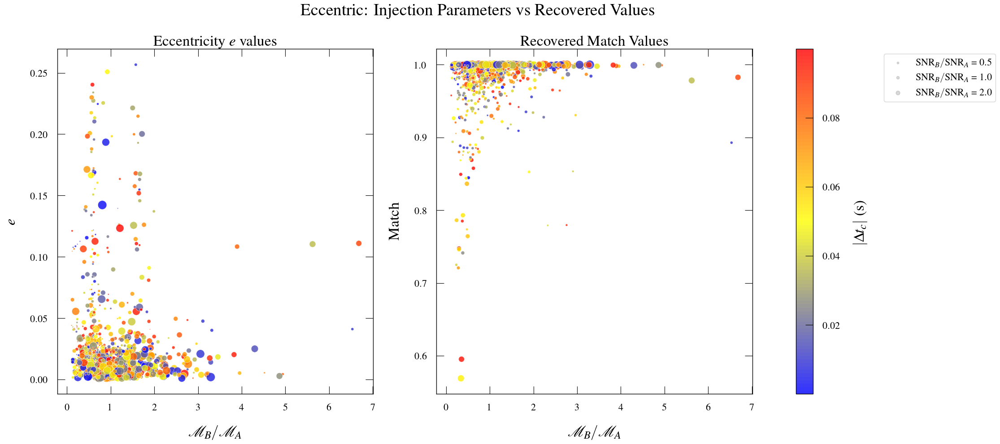

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, e_ecc, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$e$')
axes[0].set_title('Eccentricity $e$ values')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, match_ecc, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('Match')
axes[1].set_title('Recovered Match Values')

axes[1].set_axisbelow(True)
cbar = plt.colorbar(scatter2, ax=[axes[0], axes[1]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[1].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

fig.suptitle('Eccentric: Injection Parameters vs Recovered Values')
plt.savefig('../../output/pe_population_3G/match_population/ECC.png')
plt.show()

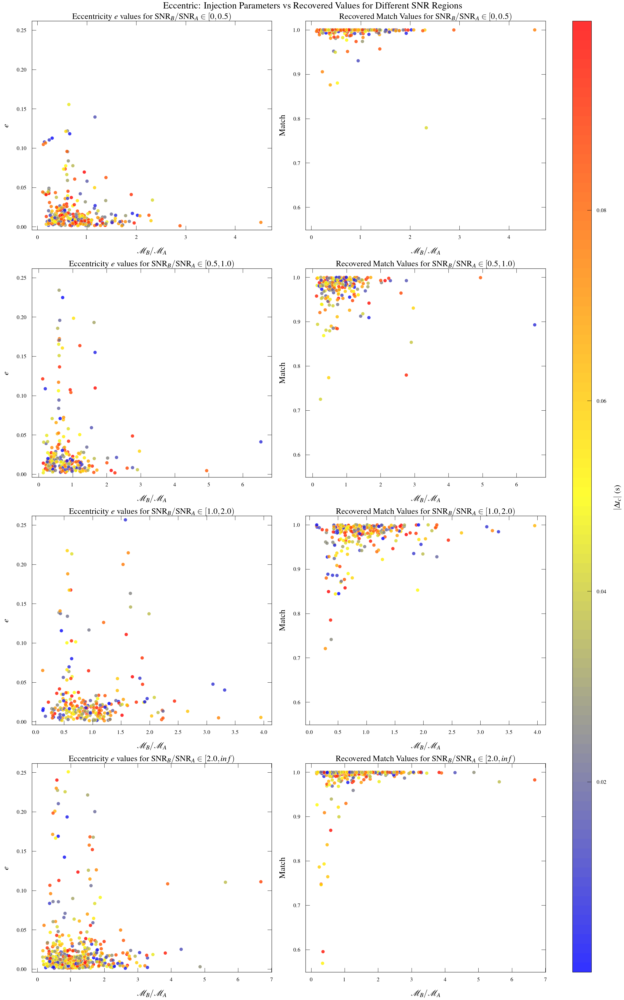

In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(25, 40), constrained_layout=True)

for i, (snr_min, snr_max) in enumerate(snr_regions):
    mask = (snr_b / snr_a > snr_min) & (snr_b / snr_a <= snr_max)

    scatter1 = axes[i, 0].scatter(
        mchirp_b[mask] / mchirp_a[mask], e_ecc[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 0].set_ylabel('$e$')
    axes[i, 0].set_title('Eccentricity $e$ values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 0].set_ylim(np.min(e_ecc)-0.005, np.max(e_ecc)+0.005)

    scatter2 = axes[i, 1].scatter(
        mchirp_b[mask] / mchirp_a[mask], match_ecc[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 1].set_ylabel('Match')
    axes[i, 1].set_title('Recovered Match Values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 1].set_ylim(np.min(match_ecc)-0.02, np.max(match_ecc)+0.02)

cbar = fig.colorbar(scatter2, ax=axes, location='right', aspect=50)
cbar.set_label('$|\Delta t_c|$ (s)')
fig.suptitle('Eccentric: Injection Parameters vs Recovered Values for Different SNR Regions')
plt.savefig('../../output/pe_population_3G/match_population/ECC_SNR.png')
plt.show()

## Singles Recovery

In [ ]:
match, mchirp, eta = np.zeros(len(indices)), np.zeros(len(indices)), np.zeros(len(indices))
for i in range(len(indices)):
    try:
        data_H1 = np.load('../../output/pe_population_3G/population/FF_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_H1, mchirp_H1, eta_H1 = data_H1[0], data_H1[1], data_H1[2]
        data_L1 = np.load('../../output/pe_population_3G/population/FF_2D_L1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_L1, mchirp_L1, eta_L1 = data_L1[0], data_L1[1], data_L1[2]
        data_V1 = np.load('../../output/pe_population_3G/population/FF_2D_V1_{}.npy'.format(indices[i]), allow_pickle=True)
        match_V1, mchirp_V1, eta_V1 = data_V1[0], data_V1[1], data_V1[2]

        match[i] = np.sqrt(np.median([match_H1**2, match_L1**2, match_V1**2]))
        mchirp[i] = np.median([mchirp_H1, mchirp_L1, mchirp_V1])
        eta[i] = np.median([eta_H1, eta_L1, eta_V1])
    except:
        data = np.load('../../output/pe_population_3G/population/FF_2D_H1_{}.npy'.format(indices[i]), allow_pickle=True)
        match[i], mchirp[i], eta[i], = data[0], data[1], data[2]

In [28]:
match, mchirp, eta = match[mask_0], mchirp[mask_0], eta[mask_0]

In [29]:
bias_mchirp_a = np.abs(mchirp-mchirp_a)/mchirp_a*100
bias_mchirp_b = np.abs(mchirp-mchirp_b)/mchirp_b*100

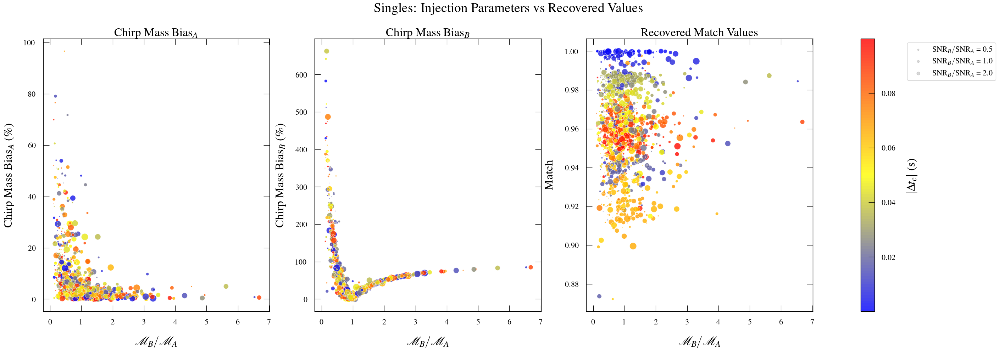

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(35, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, bias_mchirp_a, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('Chirp Mass Bias$_A$ (\%)')
axes[0].set_title('Chirp Mass Bias$_A$')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, bias_mchirp_b, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('Chirp Mass Bias$_B$ (\%)')
axes[1].set_title('Chirp Mass Bias$_B$')

axes[1].set_axisbelow(True)

scatter3 = axes[2].scatter(mchirp_b/mchirp_a, match, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('Match')
axes[2].set_title('Recovered Match Values')

axes[2].set_axisbelow(True)
cbar = plt.colorbar(scatter3, ax=[axes[0], axes[1], axes[2]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

fig.suptitle('Singles: Injection Parameters vs Recovered Values')
plt.savefig('../../output/pe_population_3G/match_population/SINGLES.png')
plt.show()

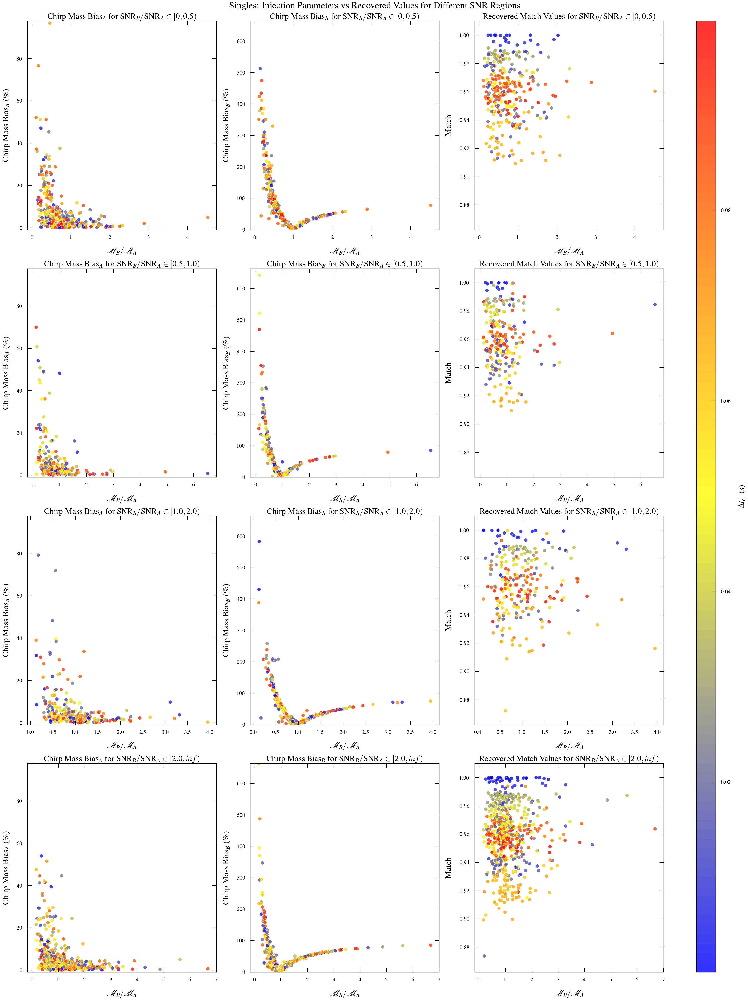

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(30, 40), constrained_layout=True)
snr_regions = [(0, 0.5), (0.5, 1.0), (1.0, 2.0), (2.0, np.inf)]

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)

for i, (snr_min, snr_max) in enumerate(snr_regions):
    mask = (snr_b / snr_a > snr_min) & (snr_b / snr_a <= snr_max)

    scatter1 = axes[i, 0].scatter(
        mchirp_b[mask] / mchirp_a[mask], bias_mchirp_a[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 0].set_ylabel('Chirp Mass Bias$_A$ (\%)')
    axes[i, 0].set_title('Chirp Mass Bias$_A$ for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 0].set_ylim(np.min(bias_mchirp_a)-1, np.max(bias_mchirp_a)+1)

    scatter2 = axes[i, 1].scatter(
        mchirp_b[mask] / mchirp_a[mask], bias_mchirp_b[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 1].set_ylabel('Chirp Mass Bias$_B$ (\%)')
    axes[i, 1].set_title('Chirp Mass Bias$_B$ for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 1].set_ylim(np.min(bias_mchirp_b)-1, np.max(bias_mchirp_b)+1)

    scatter3 = axes[i, 2].scatter(
        mchirp_b[mask] / mchirp_a[mask], match[mask], c=np.abs(delta_tc[mask]), 
        cmap=custom_cmap, s=100, alpha=0.8, edgecolor='white', linewidth=0.5
    )
    axes[i, 2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
    axes[i, 2].set_ylabel('Match')
    axes[i, 2].set_title('Recovered Match Values for $\mathrm{{SNR}}_B/\mathrm{{SNR}}_A \in [{}, {})$'.format(snr_min, snr_max))
    
    axes[i, 2].set_ylim(np.min(match)-0.01, np.max(match)+0.01)

cbar = fig.colorbar(scatter3, ax=axes, location='right', aspect=50)
cbar.set_label('$|\Delta t_c|$ (s)')

fig.suptitle('Singles: Injection Parameters vs Recovered Values for Different SNR Regions')
plt.savefig('../../output/pe_population_3G/match_population/SINGLES_SNR.png')
plt.show()

### Comparisions

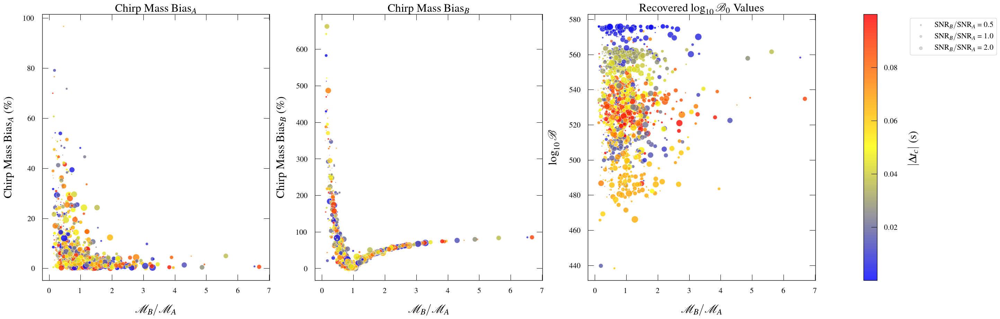

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(36, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, bias_mchirp_a, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('Chirp Mass Bias$_A$ (\%)')
axes[0].set_title('Chirp Mass Bias$_A$')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, bias_mchirp_b, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('Chirp Mass Bias$_B$ (\%)')
axes[1].set_title('Chirp Mass Bias$_B$')

axes[1].set_axisbelow(True)

log_bayes_factor_0 = snr_a**2 * match**2

scatter3 = axes[2].scatter(mchirp_b/mchirp_a, log_bayes_factor_0, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('$\log_{10}\mathcal{B}$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_0$ Values')

axes[2].set_axisbelow(True)
cbar = plt.colorbar(scatter3, ax=[axes[0], axes[1], axes[2]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

plt.savefig('../../output/pe_population_3G/match_population/SinglesFFPopulation.pdf')
plt.show()

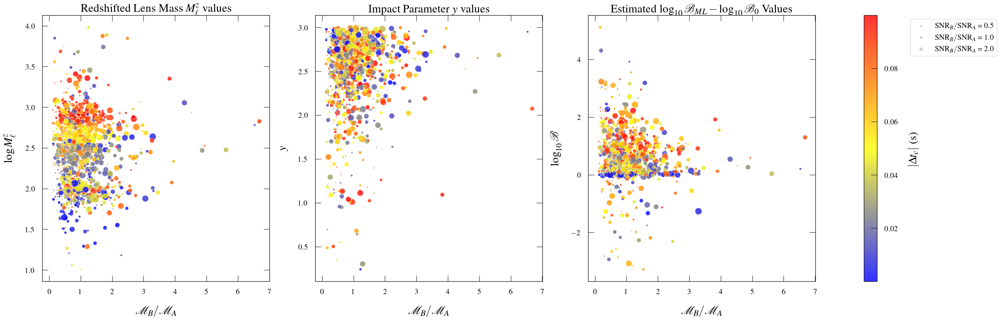

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(36, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, np.log10(Ml_z_ml), c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$\\log M_{\\ell}^z$')
axes[0].set_title('Redshifted Lens Mass $M_{\ell}^z$ values')

axes[0].set_axisbelow(True)

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, y_ml, c=np.abs(delta_tc), 
                      cmap=custom_cmap, s=sizes, alpha=0.8, 
                      edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('$y$')
axes[1].set_title('Impact Parameter $y$ values')

axes[1].set_axisbelow(True)

log_bayes_factor_ml_diff = snr_a**2*(match_ml**2-match**2)/20

scatter3 = axes[2].scatter(mchirp_b/mchirp_a, log_bayes_factor_ml_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('$\log_{10}\mathcal{B}$')
axes[2].set_title('Estimated $\log_{10}\mathcal{B}_{{ML}}-\log_{10}\mathcal{B}_0$ Values')

axes[2].set_axisbelow(True)

cbar = plt.colorbar(scatter3, ax=[axes[0], axes[1], axes[2]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

plt.savefig('../../output/pe_population_3G/match_population/MicrolensedFFPopulation.pdf')
plt.show()

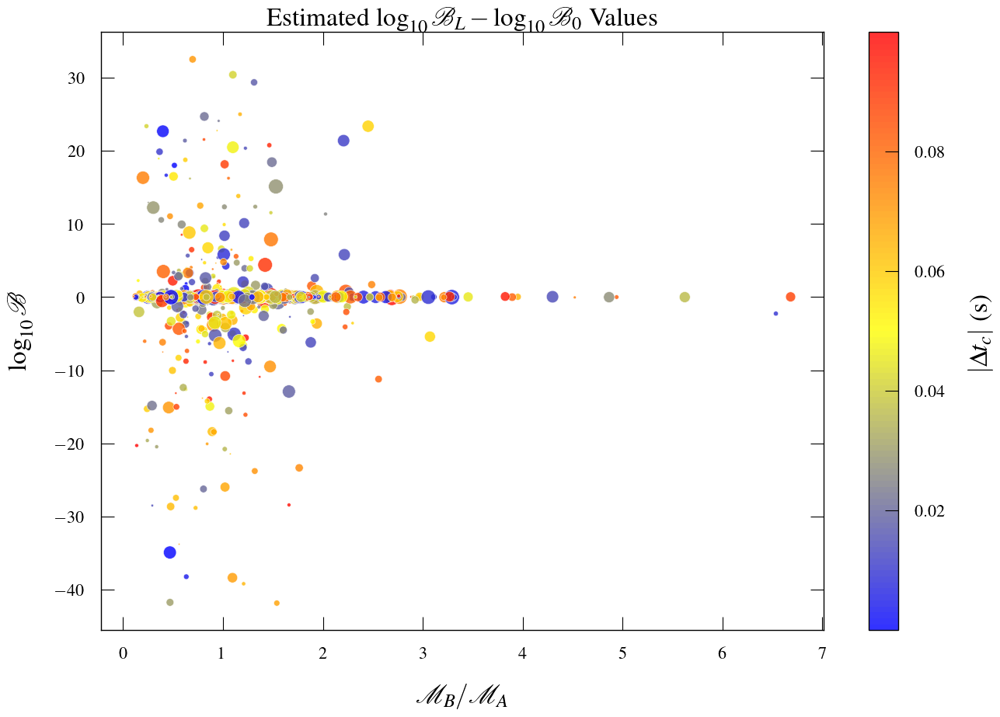

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(15, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

log_bayes_factor_ml2_diff = snr_a**2*(match_ml2**2-match**2)/2

scatter = axes.scatter(mchirp_b/mchirp_a, log_bayes_factor_ml2_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes.set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_ylabel('$\log_{10}\mathcal{B}$')
axes.set_title('Estimated $\log_{10}\mathcal{B}_{{L}}-\log_{10}\mathcal{B}_0$ Values')
axes.set_axisbelow(True)

cbar = plt.colorbar(scatter, ax=axes)
cbar.set_label('$|\Delta t_c|$ (s)')

plt.savefig('../../output/pe_population_3G/match_population/TypeIILensedFFPopulation.pdf')
plt.show()

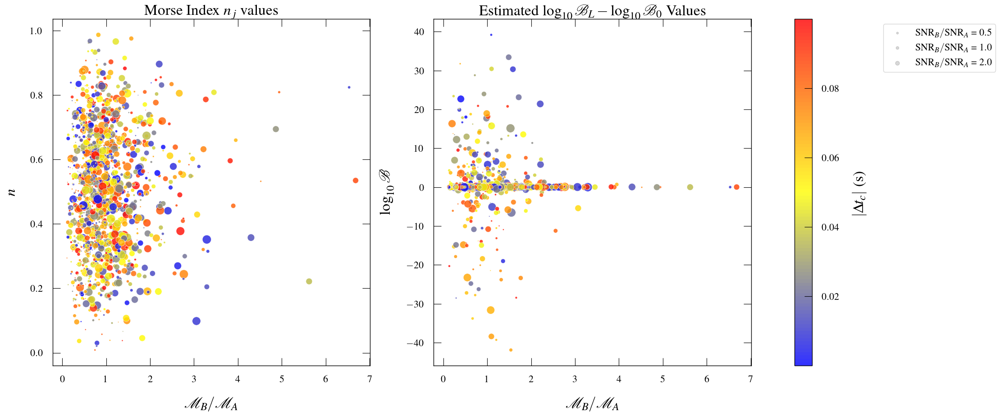

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, n_ml2c, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$n$')
axes[0].set_title('Morse Index $n_j$ values')

axes[0].set_axisbelow(True)

log_bayes_factor_ml2c_diff = snr_a**2*(match_ml2c**2-match**2)/2

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, log_bayes_factor_ml2c_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8,
                        edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('$\log_{10}\mathcal{B}$')
axes[1].set_title('Estimated $\log_{10}\mathcal{B}_{{L}}-\log_{10}\mathcal{B}_0$ Values')

axes[1].set_axisbelow(True)

cbar = plt.colorbar(scatter2, ax=[axes[0], axes[1]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[1].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

plt.savefig('../../output/pe_population_3G/match_population/TypeIICLensedFFPopulation.pdf', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

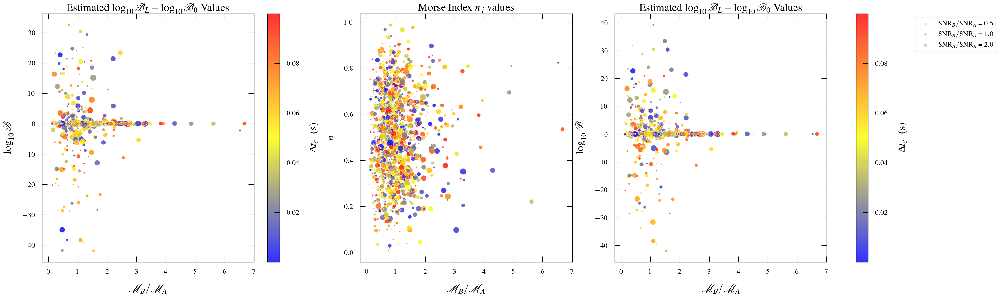

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(36, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter = axes[0].scatter(mchirp_b/mchirp_a, log_bayes_factor_ml2_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$\log_{10}\mathcal{B}$')
axes[0].set_title('Estimated $\log_{10}\mathcal{B}_{{L}}-\log_{10}\mathcal{B}_0$ Values')

axes[0].set_axisbelow(True)

cbar = plt.colorbar(scatter, ax=axes[0])
cbar.set_label('$|\Delta t_c|$ (s)')

scatter1 = axes[1].scatter(mchirp_b/mchirp_a, n_ml2c, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('$n$')
axes[1].set_title('Morse Index $n_j$ values')

axes[1].set_axisbelow(True)

log_bayes_factor_ml2c_diff = snr_a**2*(match_ml2c**2-match**2)/2

scatter2 = axes[2].scatter(mchirp_b/mchirp_a, log_bayes_factor_ml2c_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8,
                        edgecolor='white', linewidth=0.5)
axes[2].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_ylabel('$\log_{10}\mathcal{B}$')
axes[2].set_title('Estimated $\log_{10}\mathcal{B}_{{L}}-\log_{10}\mathcal{B}_0$ Values')

axes[2].set_axisbelow(True)

cbar1 = plt.colorbar(scatter2, ax=[axes[1], axes[2]])
cbar1.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[2].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

plt.savefig('../../output/pe_population_3G/match_population/TypeIICLensedFFPop.pdf')
plt.show()
plt.close()

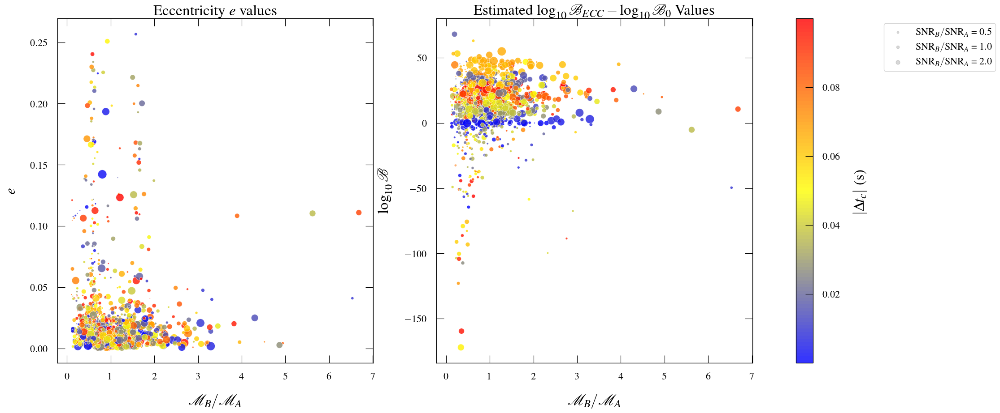

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("custom", ['blue', 'yellow', 'red'], N=100)
sizes = 200 * (snr_b/snr_a / np.max(snr_b/snr_a))

scatter1 = axes[0].scatter(mchirp_b/mchirp_a, e_ecc, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8, 
                        edgecolor='white', linewidth=0.5)
axes[0].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_ylabel('$e$')
axes[0].set_title('Eccentricity $e$ values')

axes[0].set_axisbelow(True)

log_bayes_factor_ecc_diff = snr_a**2*(match_ecc**2-match_ecc_0**2)/2

scatter2 = axes[1].scatter(mchirp_b/mchirp_a, log_bayes_factor_ecc_diff, c=np.abs(delta_tc),
                        cmap=custom_cmap, s=sizes, alpha=0.8,
                        edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_ylabel('$\log_{10}\mathcal{B}$')
axes[1].set_title('Estimated $\log_{10}\mathcal{B}_{{ECC}}-\log_{10}\mathcal{B}_0$ Values')

axes[1].set_axisbelow(True)

cbar = plt.colorbar(scatter2, ax=[axes[0], axes[1]])
cbar.set_label('$|\Delta t_c|$ (s)')
snr_markers = []
for snr_val in [0.5, 1.0, 2.0]:
    size = 200 * (snr_val / np.max(snr_b/snr_a))
    snr_markers.append(plt.scatter([], [], c='gray', alpha=0.3, s=size,
                                 label=f'$\mathrm{{SNR}}_B/\mathrm{{SNR}}_A$ = {snr_val:.1f}'))
axes[1].legend(handles=snr_markers, loc='upper left', bbox_to_anchor=(1.4, 1.0))

plt.savefig('../../output/pe_population_3G/match_population/EccentricFFPopulation.pdf')
plt.show()